In [ ]:
!pip install tika

  Created wheel for tika: filename=tika-1.22-cp36-none-any.whl size=30410 sha256=c7010217ac5b1bc48e1d0f4e34ba6efef0437300c65de2018be5442a948985bf
  Stored in directory: /root/.cache/pip/wheels/76/9d/c5/be9d60fca685060535e2e9635a42f77abc0d520c0eed98fcfd
Successfully built tika


In [ ]:
!python -m spacy download en_core_web_sm

✔ Download and installation successful
You can now load the model via spacy.load('en_core_web_sm')


In [ ]:
import spacy
from tika import parser
from google.colab import drive

In [ ]:
nlp = spacy.load('en_core_web_sm')

In [ ]:
!apt-get install -y -qq software-properties-common module-init-tools
!add-apt-repository -y ppa:alessandro-strada/ppa 2>&1 > /dev/null
!apt-get update -qq 2>&1 > /dev/null
!apt-get -y install -qq google-drive-ocamlfuse fuse
from google.colab import auth
auth.authenticate_user()
from oauth2client.client import GoogleCredentials
creds = GoogleCredentials.get_application_default()
import getpass
!google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret} < /dev/null 2>&1 | grep URL
vcode = getpass.getpass()
!echo {vcode} | google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret}

Selecting previously unselected package google-drive-ocamlfuse.
(Reading database ... 145655 files and directories currently installed.)
Preparing to unpack .../google-drive-ocamlfuse_0.7.14-0ubuntu1~ubuntu18.04.1_amd64.deb ...
Unpacking google-drive-ocamlfuse (0.7.14-0ubuntu1~ubuntu18.04.1) ...
Setting up google-drive-ocamlfuse (0.7.14-0ubuntu1~ubuntu18.04.1) ...
Processing triggers for man-db (2.8.3-2ubuntu0.1) ...
Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&response_type=code&access_type=offline&approval_prompt=force
··········
Please, open the following URL in a web browser: https://accounts.google.com/o/oauth2/auth?client_id=32555940559.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive&response_type=code&ac

In [ ]:
!mkdir -p drive
!google-drive-ocamlfuse drive

In [ ]:
!ls /content/drive/'Colab Notebooks'/'The Great Replacement'

'Hate Speech DataSet'   negative-words.txt   test.text.out
 kg.csv		        NER.ipynb	     test.txt
 KG_updated.csv         Relevant_text.txt    The_Great_Replacement.pdf


In [ ]:
raw = parser.from_file('/content/drive/Colab Notebooks/The Great Replacement/The_Great_Replacement.pdf')

2019-11-24 19:29:41,980 [MainThread  ] [INFO ]  Retrieving http://search.maven.org/remotecontent?filepath=org/apache/tika/tika-server/1.22/tika-server-1.22.jar to /tmp/tika-server.jar.
2019-11-24 19:29:44,887 [MainThread  ] [INFO ]  Retrieving http://search.maven.org/remotecontent?filepath=org/apache/tika/tika-server/1.22/tika-server-1.22.jar.md5 to /tmp/tika-server.jar.md5.
2019-11-24 19:29:45,264 [MainThread  ] [WARNI]  Failed to see startup log message; retrying...
2019-11-24 19:29:50,272 [MainThread  ] [WARNI]  Failed to see startup log message; retrying...


In [ ]:
text = raw['content']

## **Remove unnecessary part to get the relevant part**

In [ ]:
text = text.split('Introduction')

In [ ]:
text = text[1]

In [ ]:
text

' \nIt’s the birthrates. \n\nIt’s the birthrates. \n\nIt’s the birthrates. \n\n \n\nIf there is one thing I want you to remember from these writings, its that \n\nthe birthrates must change. Even if we were to deport all Non-Europeans \n\nfrom our lands tomorrow, the European people would still be spiraling \n\ninto decay and eventual death. \n\n \n\nEvery day we become fewer in number, we grow older,we grow weaker. \n\nIn the end we must return to replacement fertility levels, or it will kill us. \n\n \n\nTo maintain a population the people must achieve a birthrate that reaches \n\nreplacement fertility levels. In the Western world this is roughly 2.06 \n\nbirths per woman. \n\n \n\nhttps://en.wikipedia.org/wiki/List_of_sovereign_states_and_dependencies\n\n_by_total_fertility_rate \n\n \n\nThere is not a single Western country, not a single white nation, that \n\nreaches these levels. \n\nNot in Europe, not in the Americas, not in Australia or New Zealand. \n\nWhite people are failing

# **Remove new line character**

In [ ]:
text=text.split('\n')

In [ ]:
text = list(filter(lambda x: x != '', text))

# **Cleanup**

In [ ]:
text = list(filter(lambda x: x != ' ', text))

In [ ]:
text = list(x.strip() for x in text)

In [ ]:
text = list(x for x in text if not x.startswith('http'))

In [ ]:
text = list(x for x in text if not x.endswith('?'))

In [ ]:
text = " ".join(str(x) for x in text)

In [ ]:
text

'It’s the birthrates. It’s the birthrates. It’s the birthrates. If there is one thing I want you to remember from these writings, its that the birthrates must change. Even if we were to deport all Non-Europeans from our lands tomorrow, the European people would still be spiraling into decay and eventual death. Every day we become fewer in number, we grow older,we grow weaker. In the end we must return to replacement fertility levels, or it will kill us. To maintain a population the people must achieve a birthrate that reaches replacement fertility levels. In the Western world this is roughly 2.06 births per woman. _by_total_fertility_rate There is not a single Western country, not a single white nation, that reaches these levels. Not in Europe, not in the Americas, not in Australia or New Zealand. White people are failing to reproduce, failing to create families, failing to have children.  But despite this sub-replacement fertility rate, the population in the West is increasing, and ra

In [ ]:
doc = nlp(text)

In [ ]:
sentences = list(doc.sents)

In [ ]:
sentences

In [ ]:
text_sent = []
for item in sentences:
  text_sent.append(str(item))

In [ ]:
text_sent

In [ ]:
text_sent = list(x for x in text_sent if not x.endswith('?'))

In [ ]:
len(text_sent)

930

In [ ]:
text_process = []
for text in text_sent:
  meta_text = nlp(text)
  tokens = [token.text for token in meta_text if not token.is_punct]
  text = " ".join(str(x) for x in tokens)
  text_process.append(text)

# **Filter sentences using negative lexicons**

In [ ]:
with open('/content/drive/Colab Notebooks/The Great Replacement/negative-words.txt', 'r', encoding='ISO-8859-1') as file:
    negative_words = file.read()

In [ ]:
negative_words = negative_words.split('\n')

In [ ]:
negative_words

In [ ]:
text_sent

In [ ]:
filtered_text = []
for sent in text_sent:
  meta_list = sent.split(' ')
  for x in negative_words:
    if x in meta_list:
      filtered_text.append(sent)
      break

In [ ]:
len(filtered_text)

311

In [ ]:
filtered_text

In [ ]:
filtered_text = " ".join(str(x) for x in filtered_text)

In [ ]:
text_file = open("/content/drive/Colab Notebooks/The Great Replacement/Relevant_text.txt", "w")
text_file.write(filtered_text)
text_file.close()

In [ ]:
type(filtered_text[1])

str

## **Using Spacy**

In [ ]:
import pandas as pd

#df = pd.DataFrame(filtered_text, columns = ['Sentence'])

In [ ]:
df.dtypes

Sentence    object
dtype: object

In [ ]:
df.head(5)

,Sentence,list_sentences
0,Even if we were to deport all Non Europeans from our lands tomorrow the European people would still be spiraling into decay and eventual death,"[Even, if, we, were, to, deport, all, Non, Europeans, from, our, lands, tomorrow, the, European, people, would, still, be, spiraling, into, decay, and, eventual, death]"
1,Every day we become fewer in number we grow older we grow weaker,"[Every, day, we, become, fewer, in, number, we, grow, older, we, grow, weaker]"
2,In the end we must return to replacement fertility levels or it will kill us,"[In, the, end, we, must, return, to, replacement, fertility, levels, or, it, will, kill, us]"
3,White people are failing to reproduce failing to create families failing to have children,"[White, people, are, failing, to, reproduce, failing, to, create, families, failing, to, have, children, , ]"
4,Invited by the state and corporate entities to replace the White people who have failed to reproduce failed to create the cheap labour new consumers and tax base that the corporations and states n...,"[Invited, by, the, state, and, corporate, entities, to, replace, the, White, people, who, have, failed, to, reproduce, failed, to, create, the, cheap, labour, new, consumers, and, tax, base, that,..."


In [ ]:
pd.set_option('display.max_colwidth', 200)

In [ ]:
df['list_sentences'] = df['Sentence'].apply(lambda x: x.split(' '))

In [ ]:
len(df)

400

In [ ]:
df =df[(df['list_sentences'].map(len) >= 3)]

In [ ]:
def getcount(x):
  subj_count = 0
  obj_count = 0
  nlp_doc = nlp(x)
  for token in nlp_doc:
    if(token.dep_ == 'nsubj'):
      subj_count+=1
  
  return subj_count

In [ ]:
df['num_subj'] = df['Sentence'].apply(lambda x: getcount(x))

In [ ]:
def getobjcount(x):
  obj_count = 0
  nlp_doc = nlp(x)
  for token in nlp_doc:
    if(token.dep_ == 'dobj'):
      obj_count+=1
  
  return obj_count

In [ ]:
df['num_obj'] = df['Sentence'].apply(lambda x: getobjcount(x))

In [ ]:
df.head(10)

,Sentence,list_sentences,num_subj,num_obj
0,Even if we were to deport all Non Europeans from our lands tomorrow the European people would still be spiraling into decay and eventual death,"[Even, if, we, were, to, deport, all, Non, Europeans, from, our, lands, tomorrow, the, European, people, would, still, be, spiraling, into, decay, and, eventual, death]",2,1
1,Every day we become fewer in number we grow older we grow weaker,"[Every, day, we, become, fewer, in, number, we, grow, older, we, grow, weaker]",3,0
2,In the end we must return to replacement fertility levels or it will kill us,"[In, the, end, we, must, return, to, replacement, fertility, levels, or, it, will, kill, us]",2,1
3,White people are failing to reproduce failing to create families failing to have children,"[White, people, are, failing, to, reproduce, failing, to, create, families, failing, to, have, children, , ]",1,2
4,Invited by the state and corporate entities to replace the White people who have failed to reproduce failed to create the cheap labour new consumers and tax base that the corporations and states n...,"[Invited, by, the, state, and, corporate, entities, to, replace, the, White, people, who, have, failed, to, reproduce, failed, to, create, the, cheap, labour, new, consumers, and, tax, base, that,...",2,3
5,This crisis of mass immigration and sub replacement fertility is an assault on the European people that if not combated will ultimately result in the complete racial and cultural replacement of th...,"[This, crisis, of, mass, immigration, and, sub, replacement, fertility, is, an, assault, on, the, European, people, that, if, not, combated, will, ultimately, result, in, the, complete, racial, an...",1,0
6,There are myriad reasons behind the decline in fertility rates and the destruction of the traditional family unit,"[There, are, myriad, reasons, behind, the, decline, in, fertility, rates, and, the, destruction, of, the, traditional, family, unit]",0,0
7,We must inevitably correct the disaster of hedonistic nihilistic individualism,"[We, must, inevitably, correct, the, disaster, of, hedonistic, nihilistic, individualism]",1,1
8,But it will take take some time time we do not have due to the crisis of mass immigration,"[But, it, will, take, take, some, time, time, we, do, not, have, due, to, the, crisis, of, mass, immigration]",2,0
9,Due to mass immigration we lack the time scale required to enact the civilizational paradigm shift we need to undertake to return to health and prosperity,"[Due, to, mass, immigration, we, lack, the, time, scale, required, to, enact, the, civilizational, paradigm, shift, we, need, to, undertake, to, return, to, health, and, prosperity]",2,2


In [ ]:
final_df =df[(df['num_subj'] == 1) & (df['num_obj'] == 1)]

In [ ]:
final_df.head(10)

,Sentence,list_sentences,num_subj,num_obj
7,We must inevitably correct the disaster of hedonistic nihilistic individualism,"[We, must, inevitably, correct, the, disaster, of, hedonistic, nihilistic, individualism]",1,1
12,I had a regular childhood without any great issues,"[I, had, a, regular, childhood, without, any, great, issues]",1,1
22,To create an atmosphere of fear and change in which drastic powerful and revolutionary action can occur,"[To, create, an, atmosphere, of, fear, and, change, in, which, drastic, powerful, and, revolutionary, action, can, occur]",1,1
29,There was a period of time 2 years prior to the attack to the attack that dramatically changed my views,"[There, was, a, period, of, time, 2, years, prior, to, the, attack, to, the, attack, that, dramatically, changed, my, views]",1,1
40,Ebba death at the hands of the invaders the indignity of her violent demise and my inability to stop it broke through my own jaded cynicism like a sledgehammer,"[Ebba, death, at, the, hands, of, the, invaders, the, indignity, of, her, violent, demise, and, my, inability, to, stop, it, broke, through, my, own, jaded, cynicism, like, a, sledgehammer]",1,1
41,I could no longer ignore the attacks,"[I, could, no, longer, ignore, the, attacks]",1,1
44,Despite this ridiculous match up the possibility of a victory by the quasi nationalist was at least to myself a sign that maybe a political solution was still possible,"[Despite, this, ridiculous, match, up, the, possibility, of, a, victory, by, the, quasi, nationalist, was, at, least, to, myself, a, sign, that, maybe, a, political, solution, was, still, possible]",1,1
48,I had seen enough and in anger drove out of the the town refusing to stay any longer in the cursed place and headed on to the next town,"[I, had, seen, enough, and, in, anger, drove, out, of, the, the, town, refusing, to, stay, any, longer, in, the, cursed, place, and, headed, on, to, the, next, town]",1,1
51,Their number uncountable the representation of their loss unfathomable,"[Their, number, uncountable, the, representation, of, their, loss, unfathomable]",1,1
56,Though I did contact the reborn Knights Templar for a blessing in support of the attack which was given,"[Though, I, did, contact, the, reborn, Knights, Templar, for, a, blessing, in, support, of, the, attack, which, was, given]",1,1


In [ ]:
len(final_df)

60

# **Extract subject and object**

In [ ]:
def get_entities(sent):

  ent1 = ""
  ent2 = ""

  prv_tok_dep = ""    # dependency tag of previous token in the sentence
  prv_tok_text = ""   # previous token in the sentence

  prefix = ""
  modifier = ""

  
  for tok in nlp(sent):
    # if token is a punctuation mark then move on to the next token
    if tok.dep_ != "punct":
      # check: token is a compound word or not
      if tok.dep_ == "compound":
        prefix = tok.text
        # if the previous word was also a 'compound' then add the current word to it
        if prv_tok_dep == "compound":
          prefix = prv_tok_text + " "+ tok.text
      
      # check: token is a modifier or not
      if tok.dep_.endswith("mod") == True:
        modifier = tok.text
        # if the previous word was also a 'compound' then add the current word to it
        if prv_tok_dep == "compound":
          modifier = prv_tok_text + " "+ tok.text
      
      
      if tok.dep_.find("subj") == True:
        ent1 = modifier +" "+ prefix + " "+ tok.text
        prefix = ""
        modifier = ""
        prv_tok_dep = ""
        prv_tok_text = ""      

      
      if tok.dep_.find("obj") == True:
        ent2 = modifier +" "+ prefix +" "+ tok.text
        
        
      # update variables
      prv_tok_dep = tok.dep_
      prv_tok_text = tok.text
  

  return [ent1.strip(), ent2.strip()]

In [ ]:
get_entities('Though I did contact the reborn Knights Templar for a blessing in support of the attack which was given')

['reborn Knights which', 'reborn Knights attack']

In [ ]:
from tqdm import tqdm
entity_pairs = []

for i in tqdm(final_df["Sentence"]):
  entity_pairs.append(get_entities(i))

100%|██████████| 60/60 [00:00<00:00, 95.41it/s]


In [ ]:
entity_pairs[:10]

[['We', 'nihilistic  individualism'],
 ['I', 'great  issues'],
 ['powerful  action', 'which'],
 ['prior  that', 'dramatically  views'],
 ['Ebba  death', 'jaded  sledgehammer'],
 ['I', 'longer  attacks'],
 ['political quasi solution', 'least quasi myself'],
 ['I', 'next  town'],
 ['number', 'loss'],
 ['reborn Knights which', 'reborn Knights attack']]

# **Relation/Predicate Extraction**

In [ ]:
from spacy.matcher import Matcher 
from spacy.tokens import Span 

def get_relation(sent):

  doc = nlp(sent)

  # Matcher class object 
  matcher = Matcher(nlp.vocab)

  #define the pattern 
  pattern = [{'DEP':'ROOT'}, 
            {'DEP':'prep','OP':"?"},
            {'DEP':'agent','OP':"?"},  
            {'POS':'ADJ','OP':"?"}] 

  matcher.add("matching_1", None, pattern) 

  matches = matcher(doc)
  k = len(matches) - 1

  span = doc[matches[k][1]:matches[k][2]] 

  return(span.text)

In [ ]:
relations = [get_relation(i) for i in tqdm(final_df['Sentence'])]

100%|██████████| 60/60 [00:00<00:00, 98.44it/s]


In [ ]:
pd.Series(relations).value_counts()[:50]

is                  4
was                 3
had                 2
fucking dead        2
dislike             1
hold                1
is weak             1
have                1
accept              1
go                  1
hate                1
profanes            1
correct             1
writ by             1
destroy             1
begun               1
were                1
hit                 1
create              1
is environmental    1
conserved other     1
born in             1
losing              1
lost                1
are                 1
stall               1
trained             1
menace of           1
ignore              1
goddamn             1
like                1
blame               1
am                  1
redistribute        1
contact             1
risk                1
are chaotic         1
deserve             1
signal              1
be able             1
congregate          1
taught              1
seen                1
strapped            1
holds               1
needs     

In [ ]:
# extract subject
source = [i[0] for i in entity_pairs]

# extract object
target = [i[1] for i in entity_pairs]

kg_df = pd.DataFrame({'source':source, 'target':target, 'edge':relations})

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# create a directed-graph from a dataframe
G=nx.from_pandas_edgelist(kg_df, "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())

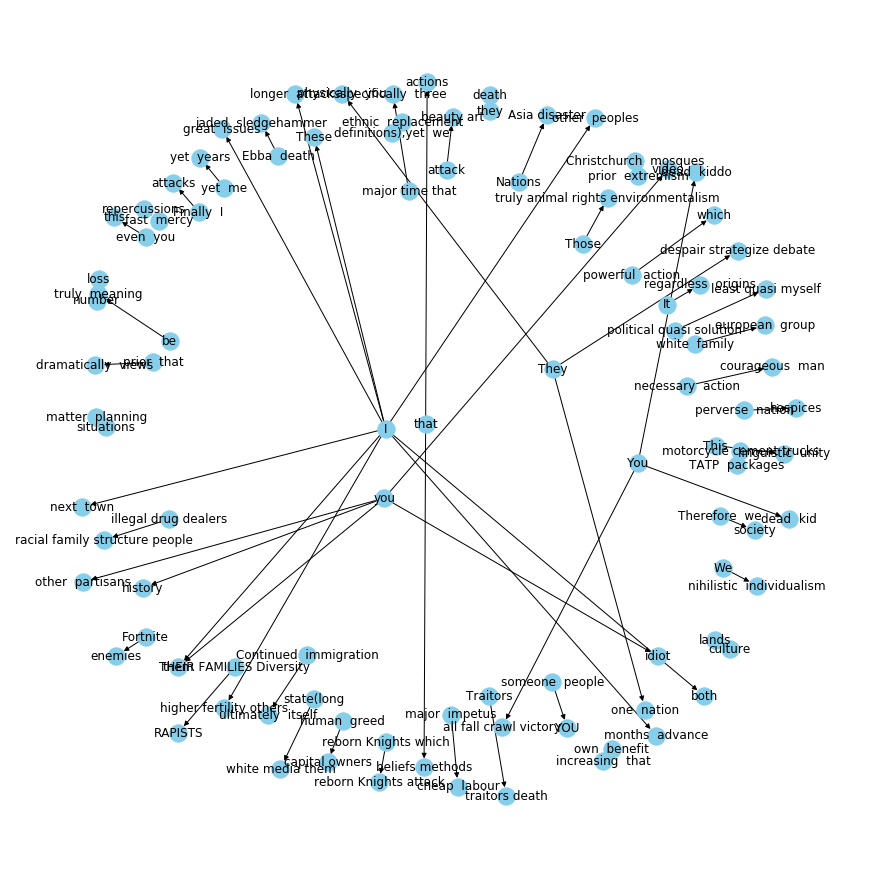

In [ ]:
plt.figure(figsize=(12,12))

pos = nx.spring_layout(G)
nx.draw(G, with_labels=True, node_color='skyblue', edge_cmap=plt.cm.Blues, pos = pos)
plt.show()

# **Using Stanford NER**

In [ ]:
fil = open('/content/drive/Colab Notebooks/The Great Replacement/test.txt')
textfile = fil.read()

In [ ]:
textfile

"European people | deport | Non-Europeans\nEuropean people | still spiral | decay\n//it | will kill | us\nwe | must return to | replacement fertility levels\n//we | must return In | end\n//people | are failing | reproduce\nwhite people | are failing | reproduce\n//White people | are failing | failing\n//people | are failing | failing\ncorporations | need | thrive\n//corporations | need | states\n//corporations | need | states\n//corporations | need | that\ndecline | is in | fertility rates\nwe | must correct | disaster of hedonistic individualism\n//We | must correct | disaster\n//We | must inevitably correct | disaster\n//We | must inevitably correct | disaster of hedonistic\n//we | undertake | return\n//we | lack | time scale\n//we | need | undertake\nwe | enact the civilizational paradigm shift | return to health\n//we | Due lack | time scale required\nwe | lack | time scale required\n//we | Due lack | time scale\n//immigration | will disenfranchise | us\nmass immigration | will dis

In [ ]:
entity_relations = textfile.split("\n")

In [ ]:
entity_relations.remove('')

In [ ]:
entity_relations[-1]

'beauty | is in | end'

In [ ]:
import pandas as pd

source =[]
target =[]
relations = []
for item in entity_relations:
  if not item.startswith('//'):
    sent = item.split("|")
    #sent.remove('')
    """for n, i in enumerate(sent):
      if i == '\'re':
        a[n] = 'are'"""
    print(sent)
    source.append(sent[0].strip())
    target.append(sent[2].strip())
    relations.append(sent[1].strip())  

for i in source:
  i = i.strip()
for j in target:
  j = j.strip()
for k in relations:
  k = k.strip()


kg_df = pd.DataFrame({'source':source, 'target':target, 'edge':relations})

In [ ]:
source[0]

In [ ]:
kg_df.head()

In [ ]:
kg_df.to_csv('/content/drive/Colab Notebooks/The Great Replacement/kg.csv',index=False)

In [ ]:
import pandas as pd
kg_df = pd.read_csv('/content/drive/Colab Notebooks/The Great Replacement/KG_updated.csv')

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

# create a directed-graph from a dataframe
G=nx.from_pandas_edgelist(kg_df, "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())

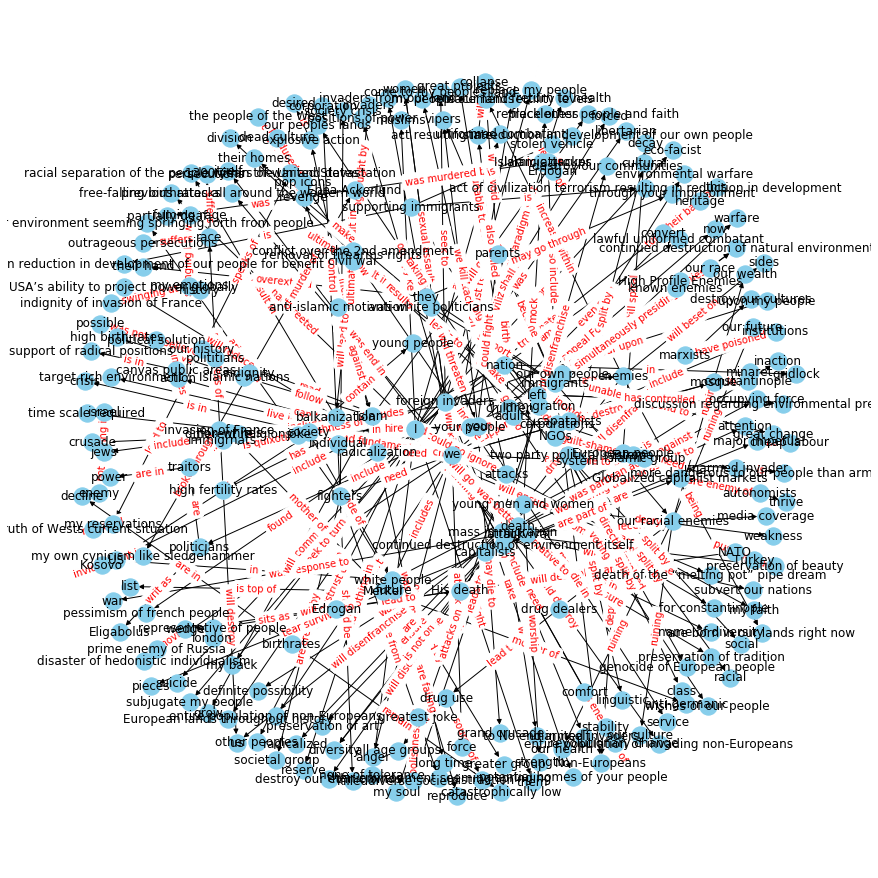

In [ ]:
Edge_Labels = {}
for u,v,c in G.edges(data=True):
  #Edge_Labels = {(u,v): c['edge']}
  Edge_Labels[(u,v)] = c['edge']

plt.figure(figsize=(12,12))
pos = nx.spring_layout(G)
nx.draw(G, with_labels=True, node_color='skyblue', edge_cmap=plt.cm.Blues, pos = pos)
nx.draw_networkx_edge_labels(G,pos,edge_labels=Edge_Labels,font_color='red')
plt.show()

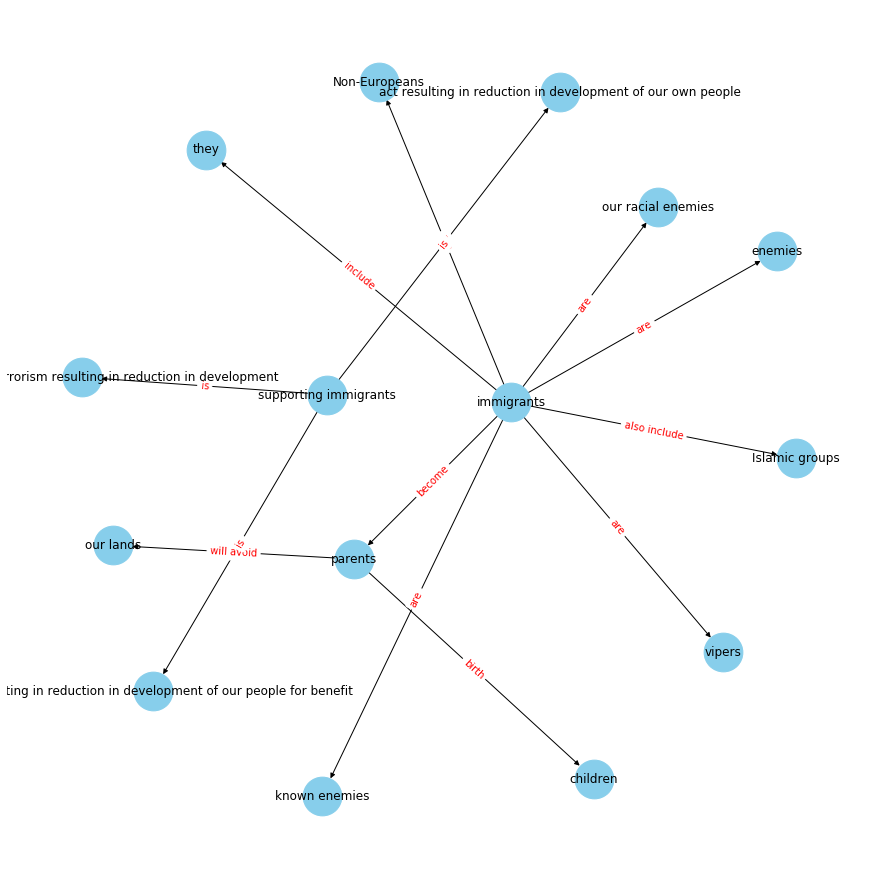

In [ ]:
filtered_source = kg_df[kg_df['source'].str.contains("immigrant") | kg_df['source'].str.contains("parents")| kg_df['target'].str.contains('children')]
G=nx.from_pandas_edgelist(filtered_source, "source", "target", 
                          edge_attr=True, create_using=nx.MultiDiGraph())
Edge_Labels = {}
for u,v,c in G.edges(data=True):
  #Edge_Labels = {(u,v): c['edge']}
  Edge_Labels[(u,v)] = c['edge']
  
plt.figure(figsize=(12,12))
pos = nx.spring_layout(G, k = 1.0) # k regulates the distance between nodes
nx.draw(G, with_labels=True, node_color='skyblue', node_size=1500, edge_cmap=plt.cm.Blues, pos = pos)
nx.draw_networkx_edge_labels(G,pos,edge_labels=Edge_Labels,font_color='red')
plt.show()

In [ ]:
!pip install ampligraph

     |████████████████████████████████| 133kB 6.5MB/s 
     |████████████████████████████████| 348kB 44.7MB/s 
     |████████████████████████████████| 153kB 47.7MB/s 
     |████████████████████████████████| 71kB 8.4MB/s 
     |████████████████████████████████| 6.4MB 45.8MB/s 
     |████████████████████████████████| 2.7MB 30.4MB/s 
     |████████████████████████████████| 51kB 6.3MB/s 
     |████████████████████████████████| 286kB 44.8MB/s 
     |████████████████████████████████| 61kB 8.0MB/s 
     |████████████████████████████████| 51kB 7.4MB/s 
     |████████████████████████████████| 51kB 6.1MB/s 
     |████████████████████████████████| 92kB 11.2MB/s 
     |████████████████████████████████| 92kB 11.6MB/s 
     |████████████████████████████████| 122kB 55.4MB/s 
     |████████████████████████████████| 102kB 12.3MB/s 
     |████████████████████████████████| 92kB 10.8MB/s 
  Created wheel for oset: filename=oset-0.1.3-cp36-none-any.whl size=9662 sha256=756cbcaccbd864c6acb85641127d086d7f409

# **Training the model to learn from the graph**

In [ ]:
from ampligraph.evaluation import train_test_split_no_unseen

In [ ]:
import numpy as np

In [ ]:
kg_df = kg_df[['source','edge','target']]

In [ ]:
triples = kg_df.to_numpy()

In [ ]:
triples

In [ ]:
X_train, X_valid = train_test_split_no_unseen(np.array(triples), test_size=27, allow_duplication=True)

In [ ]:
X_train.shape

(245, 3)

In [ ]:
X_valid.shape

(27, 3)

In [ ]:
from ampligraph.latent_features import ComplEx

model = ComplEx(batches_count=50,
                epochs=300,
                k=100,
                eta=20,
                optimizer='adam', 
                optimizer_params={'lr':1e-4},
                loss='multiclass_nll',
                regularizer='LP', 
                regularizer_params={'p':3, 'lambda':1e-5}, 
                seed=0, 
                verbose=True)

WARNING - From /usr/local/lib/python3.6/dist-packages/ampligraph/latent_features/models/EmbeddingModel.py:196: The name tf.reset_default_graph is deprecated. Please use tf.compat.v1.reset_default_graph instead.

WARNING - From /usr/local/lib/python3.6/dist-packages/ampligraph/latent_features/models/EmbeddingModel.py:199: The name tf.random.set_random_seed is deprecated. Please use tf.compat.v1.random.set_random_seed instead.

WARNING - From /usr/local/lib/python3.6/dist-packages/ampligraph/latent_features/models/EmbeddingModel.py:261: The name tf.ConfigProto is deprecated. Please use tf.compat.v1.ConfigProto instead.



In [ ]:
import tensorflow as tf
tf.logging.set_verbosity(tf.logging.ERROR)

model.fit(X_train)

Average Loss:   0.176124: 100%|██████████| 300/300 [01:34<00:00,  3.27epoch/s]


In [ ]:
filter_triples = np.concatenate((X_train, X_valid))

In [ ]:
from ampligraph.evaluation import evaluate_performance

ranks = evaluate_performance(X_valid,
                             model=model, 
                             filter_triples=filter_triples,
                             use_default_protocol=True,
                             verbose=True)

100%|██████████| 27/27 [00:00<00:00, 146.22it/s]


In [ ]:
from ampligraph.evaluation import mr_score, mrr_score, hits_at_n_score

mr = mr_score(ranks)
mrr = mrr_score(ranks)

print("MRR: %.2f" % (mrr))
print("MR: %.2f" % (mr))

hits_10 = hits_at_n_score(ranks, n=10)
print("Hits@10: %.2f" % (hits_10))
hits_3 = hits_at_n_score(ranks, n=3)
print("Hits@3: %.2f" % (hits_3))
hits_1 = hits_at_n_score(ranks, n=1)
print("Hits@1: %.2f" % (hits_1))

MRR: 0.11
MR: 73.43
Hits@10: 0.15
Hits@3: 0.11
Hits@1: 0.07


# **HATE DATASET**

In [ ]:
import pandas as pd

pd.set_option('display.max_colwidth', 200)

In [ ]:
df = pd.read_csv('/content/drive/Colab Notebooks/The Great Replacement/Hate Speech DataSet/annotations_metadata.csv')

In [ ]:
df.head()

,file_id,user_id,subforum_id,num_contexts,label
0,12834217_1,572066,1346,0,noHate
1,12834217_2,572066,1346,0,noHate
2,12834217_3,572066,1346,0,noHate
3,12834217_4,572066,1346,0,hate
4,12834217_5,572066,1346,0,noHate


In [ ]:
len(df)

10944

In [ ]:
file_id = df.file_id.values.tolist()

In [ ]:
list_id = []
count=0
for item in file_id:
  fil = open('/content/drive/Colab Notebooks/The Great Replacement/Hate Speech DataSet/all_files/'+item+'.txt')
  count+=1
  textfile = fil.read()
  print(str(count)+')'+item+','+textfile)
  list_id.append([item,textfile])

1)12834217_1,As of March 13th , 2014 , the booklet had been downloaded over 18,300 times and counting .
2)12834217_2,In order to help increase the booklets downloads , it would be great if all Stormfronters who had YouTube accounts , could display the following text in the description boxes of their uploaded YouTube videos .
3)12834217_3,( Simply copy and paste the following text into your YouTube videos description boxes. )
4)12834217_4,Click below for a FREE download of a colorfully illustrated 132 page e-book on the Zionist-engineered INTENTIONAL destruction of Western civilization .
5)12834217_5,Click on the `` DOWNLOAD ( 7.42 MB ) '' green banner link .
6)12834217_6,Booklet updated on Feb. 14th , 2014 .
7)12834217_7,( Now with over 18,300 Downloads. )
8)12834217_8,PDF file : http://www.mediafire.com/download/7p3p3goadvvqvsf/WNDebateBooklet_2-14-14.pdfMSWordfile:http://www.mediafire.com/download/psezkkk4d6a3wt1/WNDebateBooklet _ 2-14-14.docx Watch the 10 hour video version of `` Th

In [ ]:
meta_df = pd.DataFrame(list_id, columns = ['file_id', 'text'])

NameError: ignored

In [ ]:
meta_df.to_csv('/content/drive/Colab Notebooks/The Great Replacement/Hate Speech DataSet/meta_df.csv',index=False)

In [ ]:
meta_df = pd.read_csv('/content/drive/Colab Notebooks/The Great Replacement/Hate Speech DataSet/meta_df.csv')

In [ ]:
meta_df.head()

,file_id,text
0,12834217_1,"As of March 13th , 2014 , the booklet had been downloaded over 18,300 times and counting ."
1,12834217_2,"In order to help increase the booklets downloads , it would be great if all Stormfronters who had YouTube accounts , could display the following text in the description boxes of their uploaded You..."
2,12834217_3,( Simply copy and paste the following text into your YouTube videos description boxes. )
3,12834217_4,Click below for a FREE download of a colorfully illustrated 132 page e-book on the Zionist-engineered INTENTIONAL destruction of Western civilization .
4,12834217_5,Click on the `` DOWNLOAD ( 7.42 MB ) '' green banner link .


In [ ]:
df = pd.merge(df, meta_df, on = 'file_id', how='outer')

In [ ]:
df.head()

,file_id,user_id,subforum_id,num_contexts,label,text
0,12834217_1,572066,1346,0,noHate,"As of March 13th , 2014 , the booklet had been downloaded over 18,300 times and counting ."
1,12834217_2,572066,1346,0,noHate,"In order to help increase the booklets downloads , it would be great if all Stormfronters who had YouTube accounts , could display the following text in the description boxes of their uploaded You..."
2,12834217_3,572066,1346,0,noHate,( Simply copy and paste the following text into your YouTube videos description boxes. )
3,12834217_4,572066,1346,0,hate,Click below for a FREE download of a colorfully illustrated 132 page e-book on the Zionist-engineered INTENTIONAL destruction of Western civilization .
4,12834217_5,572066,1346,0,noHate,Click on the `` DOWNLOAD ( 7.42 MB ) '' green banner link .


In [ ]:
df = df.drop(labels=['user_id', 'subforum_id', 'num_contexts'], axis=1)

In [ ]:
df['list_text'] = df['text'].apply(lambda x: x.split(' '))

In [ ]:
df =df[(df['list_text'].map(len) >= 3)]

In [ ]:
len(df)

10484

In [ ]:
df = df.drop(labels='list_text', axis=1)

In [ ]:
df_list = df.values.tolist()

In [ ]:
df_list

[['12834217_1',
  'noHate',
  'As of March 13th , 2014 , the booklet had been downloaded over 18,300 times and counting .'],
 ['12834217_2',
  'noHate',
  'In order to help increase the booklets downloads , it would be great if all Stormfronters who had YouTube accounts , could display the following text in the description boxes of their uploaded YouTube videos .'],
 ['12834217_3',
  'noHate',
  '( Simply copy and paste the following text into your YouTube videos description boxes. )'],
 ['12834217_4',
  'hate',
  'Click below for a FREE download of a colorfully illustrated 132 page e-book on the Zionist-engineered INTENTIONAL destruction of Western civilization .'],
 ['12834217_5',
  'noHate',
  "Click on the `` DOWNLOAD ( 7.42 MB ) '' green banner link ."],
 ['12834217_6', 'noHate', 'Booklet updated on Feb. 14th , 2014 .'],
 ['12834217_7', 'noHate', '( Now with over 18,300 Downloads. )'],
 ['12834217_8',
  'noHate',
  "PDF file : http://www.mediafire.com/download/7p3p3goadvvqvsf/WNDe

In [ ]:
final_list = []
for item in df_list:
  if (("http" not in item[2]) & ("Click" not in item[2]) & ("download" not in item[2]) & ("Download" not in item[2]) & ("click" not in item[2]) & ("YouTube" not in item[2]) & ("youtube" not in item[2])):
    final_list.append(item)

In [ ]:
final_list[0]

['12834217_6', 'noHate', 'Booklet updated on Feb. 14th , 2014 .']

In [ ]:
df = pd.DataFrame(final_list, columns = ['file_id', 'label', 'text'])

In [ ]:
pd.set_option('display.max_rows', 10000)

In [ ]:
df.head(10000)

,file_id,label,text
0,12834217_6,noHate,"Booklet updated on Feb. 14th , 2014 ."
1,12834493_1,hate,"She may or may not be a Jew but she 's certainly stupid , she seems to think the Blacks wo n't kill her alongside every other White they can get their dirty hands on , what a muppet !"
2,12843221_1,noHate,Thank you for the info. i will deffinetly look into them .
3,12843221_2,noHate,I hope there is room for one more as i am very excited about this .
4,12845600_1,noHate,I just came across this piece of garbage .
5,12845600_2,noHate,Comments say she is from SA .
6,12845600_3,noHate,Warning : Graphic .
7,12845808_1,noHate,The whites are more in the range of 4.8 million .
8,12845808_2,noHate,I believe this can be higher since I 've read reports that especially whites in the Free State were not counted in the latest census .
9,12849464_1,noHate,Thank you for posting your story .


In [ ]:
df_list = df.values.tolist()

In [ ]:
df_list

[['12834217_6', 'noHate', 'Booklet updated on Feb. 14th , 2014 .'],
 ['12834493_1',
  'hate',
  "She may or may not be a Jew but she 's certainly stupid , she seems to think the Blacks wo n't kill her alongside every other White they can get their dirty hands on , what a muppet !"],
 ['12843221_1',
  'noHate',
  'Thank you for the info. i will deffinetly look into them .'],
 ['12843221_2',
  'noHate',
  'I hope there is room for one more as i am very excited about this .'],
 ['12845600_1', 'noHate', 'I just came across this piece of garbage .'],
 ['12845600_2', 'noHate', 'Comments say she is from SA .'],
 ['12845600_3', 'noHate', 'Warning : Graphic .'],
 ['12845808_1', 'noHate', 'The whites are more in the range of 4.8 million .'],
 ['12845808_2',
  'noHate',
  "I believe this can be higher since I 've read reports that especially whites in the Free State were not counted in the latest census ."],
 ['12849464_1', 'noHate', 'Thank you for posting your story .'],
 ['12849464_2', 'noHate'

In [ ]:
final_list = []
for item in df_list:
  if not item[2].endswith('?'):
    final_list.append(item)

In [ ]:
for item in final_list:
  item[2].replace(' .','.')

In [ ]:
final_list[0]

['12834217_6', 'noHate', 'Booklet updated on Feb. 14th , 2014 .']

In [ ]:
df = pd.DataFrame(final_list, columns = ['file_id', 'label', 'text'])

In [ ]:
df.head(10000)

,file_id,label,text
0,12834217_6,noHate,"Booklet updated on Feb. 14th , 2014 ."
1,12834493_1,hate,"She may or may not be a Jew but she 's certainly stupid , she seems to think the Blacks wo n't kill her alongside every other White they can get their dirty hands on , what a muppet !"
2,12843221_1,noHate,Thank you for the info. i will deffinetly look into them .
3,12843221_2,noHate,I hope there is room for one more as i am very excited about this .
4,12845600_1,noHate,I just came across this piece of garbage .
5,12845600_2,noHate,Comments say she is from SA .
6,12845600_3,noHate,Warning : Graphic .
7,12845808_1,noHate,The whites are more in the range of 4.8 million .
8,12845808_2,noHate,I believe this can be higher since I 've read reports that especially whites in the Free State were not counted in the latest census .
9,12849464_1,noHate,Thank you for posting your story .


In [ ]:
df['list_text'] = df['text'].apply(lambda x: x.split(' '))

In [ ]:
df =df[(df['list_text'].map(len) > 3)]

In [ ]:
df = df.drop(labels='list_text', axis=1)

In [ ]:
df.head(10000)

,file_id,label,text
0,12834217_6,noHate,"Booklet updated on Feb. 14th , 2014 ."
1,12834493_1,hate,"She may or may not be a Jew but she 's certainly stupid , she seems to think the Blacks wo n't kill her alongside every other White they can get their dirty hands on , what a muppet !"
2,12843221_1,noHate,Thank you for the info. i will deffinetly look into them .
3,12843221_2,noHate,I hope there is room for one more as i am very excited about this .
4,12845600_1,noHate,I just came across this piece of garbage .
5,12845600_2,noHate,Comments say she is from SA .
6,12845600_3,noHate,Warning : Graphic .
7,12845808_1,noHate,The whites are more in the range of 4.8 million .
8,12845808_2,noHate,I believe this can be higher since I 've read reports that especially whites in the Free State were not counted in the latest census .
9,12849464_1,noHate,Thank you for posting your story .


In [ ]:
df = df.drop(labels='file_id', axis=1)

In [ ]:
df.head(5)

,label,text
0,noHate,"Booklet updated on Feb. 14th , 2014 ."
1,hate,"She may or may not be a Jew but she 's certainly stupid , she seems to think the Blacks wo n't kill her alongside every other White they can get their dirty hands on , what a muppet !"
2,noHate,Thank you for the info. i will deffinetly look into them .
3,noHate,I hope there is room for one more as i am very excited about this .
4,noHate,I just came across this piece of garbage .


In [ ]:
cols = ['text', 'label']

In [ ]:
df = df[cols]

In [ ]:
from sklearn.model_selection import train_test_split

X_train, X_test = train_test_split(df, test_size=0.2)

In [ ]:
len(X_test)

1798

In [ ]:
list_train = X_train['text'].values.tolist()

In [ ]:
list_train

["Well yes that s the thing there is a difference between being publically a White Nationalist and being a nut or some ' stereotypical skinhead ' .",
 'A good old bit of nostalgia from the days when there was hardly a blade of grass or a coon on the pitch .',
 'The matter was quickly dropped .',
 "Deuteronomy 28 : 43 God speaking to His children : `` The stranger that is within thee shall get up above thee very high ; and thou shalt come down very low '' .",
 'So he can show her off like a brand new sparkly jewel etc etc .',
 'Save your change or eat pork and beans one night instead of going out , and give the money to a White mother. photo crawling infant reaching out',
 'Something is up .',
 'This should be passed to the left too , who have been victims of ADL tactics including theft of police files , smearing , and illegal spying .',
 'So now Stormfront Ireland is solely responsible for all racist attacks in Ireland. lol Ted is right this is the work of the Kikes those * * * * ers a

In [ ]:
train_text = " ".join(str(x) for x in list_train)

In [ ]:
train_text

'Well yes that s the thing there is a difference between being publically a White Nationalist and being a nut or some \' stereotypical skinhead \' . A good old bit of nostalgia from the days when there was hardly a blade of grass or a coon on the pitch . The matter was quickly dropped . Deuteronomy 28 : 43 God speaking to His children : `` The stranger that is within thee shall get up above thee very high ; and thou shalt come down very low \'\' . So he can show her off like a brand new sparkly jewel etc etc . Save your change or eat pork and beans one night instead of going out , and give the money to a White mother. photo crawling infant reaching out Something is up . This should be passed to the left too , who have been victims of ADL tactics including theft of police files , smearing , and illegal spying . So now Stormfront Ireland is solely responsible for all racist attacks in Ireland. lol Ted is right this is the work of the Kikes those * * * * ers are never happy . Make this a 

In [ ]:
text_file = open("/content/drive/Colab Notebooks/The Great Replacement/Hate Speech DataSet/Train_text.txt", "w")
text_file.write(train_text)
text_file.close()

In [ ]:
test_x = df['text']

In [ ]:
test_x.to_csv('/content/drive/Colab Notebooks/The Great Replacement/Hate Speech DataSet/text.csv',index=False)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:1: FutureWarning: The signature of `Series.to_csv` was aligned to that of `DataFrame.to_csv`, and argument 'header' will change its default value from False to True: please pass an explicit value to suppress this warning.
  """Entry point for launching an IPython kernel.
